In [1]:
import os
import pickle

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# import seaborn as sns
# sns.set_context('notebook')
from sklearn.neighbors import DistanceMetric
from PIL import Image
import matplotlib.ticker as ticker

from sklearn.decomposition import IncrementalPCA


In [2]:
from sklearn.neighbors import NearestNeighbors

In [3]:
def find_neighbours(X, query_index, n_neighbors=36, metric='manhattan'):
    nbrs = NearestNeighbors(n_neighbors=n_neighbors, algorithm='ball_tree', metric=metric).fit(X)
    _, indices = nbrs.kneighbors(X[query_index].reshape(1, -1))
    return indices

In [38]:
def show_galaxies(df, n_galaxies=36, label=None):
    if n_galaxies == 8:
        fig, all_axes = plt.subplots(1, 8, figsize=(20, 3.5))
    elif n_galaxies == 11:
        fig, all_axes = plt.subplots(1, 11, figsize=(20, 4.5))
    elif n_galaxies == 12:
        fig, axes = plt.subplots(2, 6, figsize=(20, 7))
        all_axes = [ax for row in axes for ax in row]
    else:
        fig, axes = plt.subplots(6, 6, figsize=(20, 20))
        all_axes = [ax for row in axes for ax in row]
    for ax_n, ax in enumerate(all_axes):
        im = Image.open(df.iloc[ax_n]['png_loc'].replace('beta1', 'beta'))
        
        crop_pixels = 120
        initial_size = 424 # assumed, careful
        (left, upper, right, lower) = (crop_pixels, crop_pixels, initial_size-crop_pixels, initial_size-crop_pixels)
        im = im.crop((left, upper, right, lower))

        ax.imshow(np.array(im))
        
        if ax_n == 0:
            ax.patch.set_edgecolor('green')  
            ax.patch.set_linewidth('14')  
            # can't just disable axis as also disables border, do manually instead
            ax.xaxis.set_major_locator(ticker.NullLocator())
            ax.xaxis.set_minor_locator(ticker.NullLocator())
            ax.yaxis.set_major_locator(ticker.NullLocator())
            ax.yaxis.set_minor_locator(ticker.NullLocator())
            if label:
                ax.set_ylabel(label, labelpad=7, fontsize=14)
        else:
            ax.axis('off')
            
    fig.tight_layout(pad=1.)
    
    return fig

In [5]:
df = pd.read_parquet('/media/walml/beta/cnn_features/decals/dr5_b0_full_features_and_safe_catalog.parquet')

In [6]:
df['png_loc']

0         /media/walml/beta1/decals/png_native/dr5/J000/...
1         /media/walml/beta1/decals/png_native/dr5/J000/...
2         /media/walml/beta1/decals/png_native/dr5/J000/...
3         /media/walml/beta1/decals/png_native/dr5/J000/...
4         /media/walml/beta1/decals/png_native/dr5/J000/...
                                ...                        
305652    /media/walml/beta1/decals/png_native/dr5/J235/...
305653    /media/walml/beta1/decals/png_native/dr5/J235/...
305654    /media/walml/beta1/decals/png_native/dr5/J235/...
305655    /media/walml/beta1/decals/png_native/dr5/J235/...
305656    /media/walml/beta1/decals/png_native/dr5/J235/...
Name: png_loc, Length: 305657, dtype: object

In [7]:
wrong_size = pd.read_parquet('/home/walml/repos/zoobot_private/gz_decals_volunteers_auto_posteriors_wrongsize.parquet', columns=['iauname', 'wrong_size_statistic', 'wrong_size_warning'])

In [8]:
print(len(df))
df = pd.merge(df, wrong_size, on='iauname', how='inner')
print(len(df))

305657
273722


In [9]:
df = df[~df['wrong_size_warning']]

In [10]:
feature_cols = [col for col in df if col.startswith('feat')]

In [11]:
!pwd

/home/walml/repos/morphology-tools/similarity


In [12]:

def get_embed(features, n_components, save=''):
    embedder = IncrementalPCA(n_components=n_components)
    embed = embedder.fit_transform(features) 
     # no train/test needed as unsupervised
    if len(save) > 0:
        plt.plot(embedder.explained_variance_)  # 5 would probably do?
        plt.savefig(save)
        plt.close()
    return embed

In [13]:
features = df[feature_cols].values

In [14]:
# X = get_embed(features, n_components=10)

In [15]:
# with open('pc10_embed_for_similarity_nb.pickle', 'wb') as f:
#     pickle.dump(X, f)

In [18]:
with open('/home/walml/repos/morphology-tools/make_representations/notebooks/pc10_embed_for_similarity_nb.pickle', 'rb') as f:
    embed = pickle.load(f)

In [19]:
# interesting_index = np.argmax(df['iauname'] == 'J000115.60-034919.9')
# df.iloc[interesting_index]

In [20]:
# indices = find_neighbours(features, interesting_index, metric='euclidean')
# show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=12)  # first is itself

In [21]:
# indices = find_neighbours(embed, interesting_index, metric='euclidean')
# show_galaxies(df.iloc[np.squeeze(indices)])  # first is itself

In [23]:
tags = pd.read_csv('/home/walml/repos/recommender_hack/tags_for_shoaib.csv')  # bit old now

In [24]:
print(len(tags))
tags = tags[tags['iauname'].isin(df['iauname'])]
print(len(tags))

110764
93900


In [25]:
pairs_to_replace = [
    ('star-forming', 'starforming'),
    ('starburst', 'starforming'),
    ('starformation', 'starforming'),
    ('dust-lane', 'dustlane'),
    ('dust', 'dustlane'),
    ('dusty', 'dustlane'),
    ('edge-on', 'edgeon'),
    ('seyfert-1-galaxy', 'seyfert-1'),
    ('interaction', 'interacting'),
    ('overlapping-object', 'overlap'),
    ('overlapping', 'overlap'),
    ('central-core', 'core'),
    ('ringed', 'ring'),
    ('wrong_size', 'wrong-size'),
    ('tidal-debris', 'tidal'),
    ('objects_that_need_more_research', 'need_more_research')
]

for pair in pairs_to_replace:
    tags['tag'] = tags['tag'].replace(*pair)

In [26]:
tags['tag'].value_counts()[:40]  # ring tag stats TODO

starforming             14878
spiral                   6819
agn                      6212
disturbed                3455
ring                     3022
edgeon                   2487
overlap                  2433
merger                   2186
bar                      2087
dustlane                 1897
barred-spiral            1842
decals                   1662
sdss                     1586
irregular                1450
tidal                     862
asteroid                  824
elliptical                773
seyfert-1                 552
broadline                 542
merging                   542
spiral2                   517
hot                       499
h-alpha-peak              481
wrong-size                420
interacting               416
lenticular                409
infra-red-source          402
galaxy                    399
artifact                  383
core                      381
diffuse                   346
emission-line-galaxy      330
need_more_research        322
liner-type

In [27]:
tags['tag'].value_counts()[40:80]

fuzzy-disk            261
clumpy                249
barred                245
seyfert-2             238
group                 237
red-galaxy            237
seyfert-2-galaxy      233
smooth                225
disk                  213
ansae                 212
radio-source          206
overlapping-star      201
blue                  197
qso                   196
fuzzy                 194
spiral-2              184
disturbance           183
faint                 183
green                 180
interesting           174
tidal-tail            169
foreground-star       167
lenticular-galaxy     166
debris                165
beautiful             163
bulge                 163
lens                  161
type-s                158
overlapping-galaxy    158
lenticular_lens       157
foreground-stars      156
scattered-galaxies    154
phys560               152
type-sc               151
melting               150
weak-bar              150
type-sbc              149
bright-core           149
group-of-gal

In [28]:
top_tags = list(tags['tag'].value_counts()[:60].index)
# top_tags

In [29]:
wavelength_tags = ['agn', 'seyfert-1', 'infra-red-source', 'liner-type-agn', 'radio_galaxy', 'seyfert-2', 'seyfert-2-galaxy', 'red-galaxy', 'radio-source', 'blue', 'green', 'qso', 'emission-line-galaxy', 'radio-galaxy', 'h-alpha-peak', 'broadline']
question_tags = ['spiral', 'edgeon', 'elliptical', 'merger', 'bar', 'barred-spiral', 'merging', 'spiral2', 'spiral-2', 'strong-bar', 'barred', 'smooth', 'disk', 'disturbance']
metadata_tags = ['decals', 'sdss', 'galaxy']
duplicate_tags = ['fuzzy', 'overlapping-star', 'main-belt']

tags_to_skip = wavelength_tags + question_tags + metadata_tags + duplicate_tags

In [30]:
relevant_tags = [t for t in top_tags if t not in tags_to_skip]
relevant_tags

['starforming',
 'disturbed',
 'ring',
 'overlap',
 'dustlane',
 'irregular',
 'tidal',
 'asteroid',
 'hot',
 'wrong-size',
 'interacting',
 'lenticular',
 'artifact',
 'core',
 'diffuse',
 'need_more_research',
 'barlens',
 'star',
 'fuzzy-spiral',
 'fuzzy-disk',
 'clumpy',
 'group',
 'ansae',
 'faint',
 'interesting']

In [31]:
tag_counts = {}
top_iauname = {}
for tag in relevant_tags:
    tag_counts[tag] = tags.groupby('iauname').agg({'tag': lambda x: np.sum([t == tag for t in x])}).reset_index()
    if tag == 'diffuse' or tag == 'asteroid':
        index = -2  # -1 happens to be a bad example, and has same count (2) as many others
    else:
        index = -1
    top_iauname[tag] = tag_counts[tag].sort_values('tag').iloc[index]['iauname']

In [32]:
tag_counts['diffuse'].sort_values('tag', ascending=False)

,iauname,tag
21935,J133721.97+021950.8,2
24909,J145127.14+125152.9,2
28160,J235437.31-000501.5,2
14797,J112223.18+130440.1,2
12121,J103443.69+161342.9,2
...,...,...
9422,J095630.95+081040.3,0
9421,J095629.19+004232.0,0
9420,J095628.30+001102.3,0
9419,J095627.38+005553.9,0


In [184]:
for tag, count_df in tag_counts.items():
    print(tag, count_df['tag'].sum())

starforming 14878
disturbed 3455
ring 3022
overlap 2433
dustlane 1897
irregular 1450
tidal 862
asteroid 824
hot 499
wrong-size 420
interacting 416
lenticular 409
artifact 383
core 381
diffuse 346
need_more_research 322
barlens 285
star 279
fuzzy-spiral 270
fuzzy-disk 261
clumpy 249
group 237
ansae 212
faint 183
interesting 174


In [33]:
n_galaxies = 11

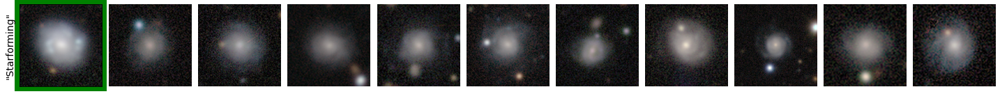

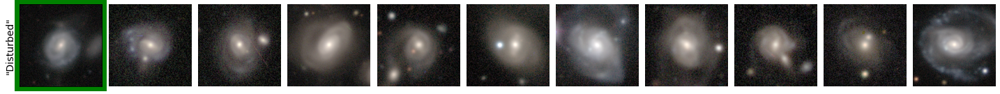

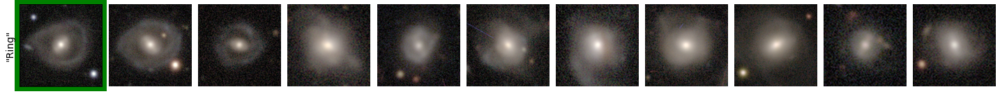

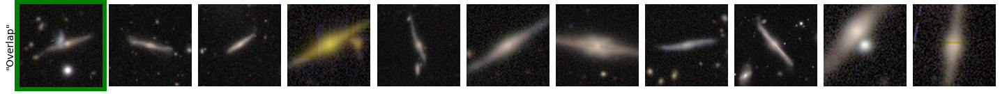

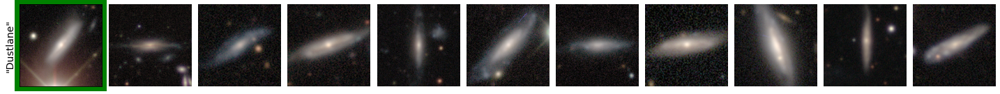

...

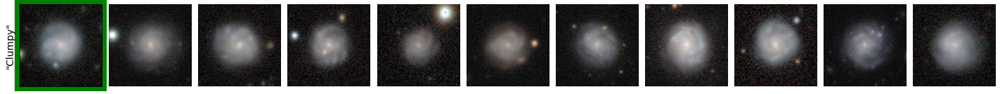

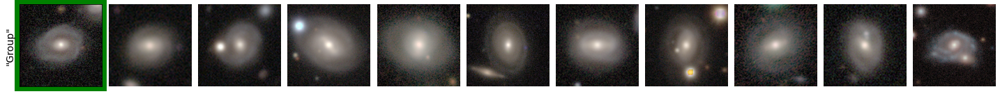

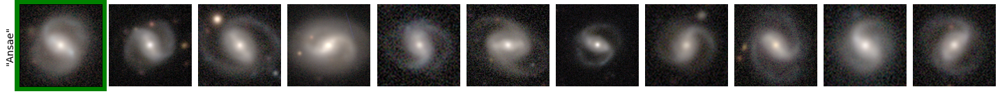

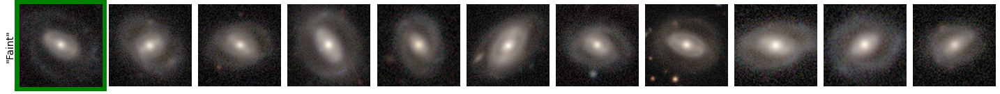

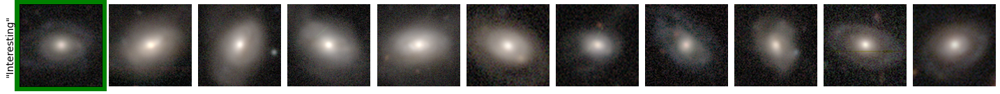

In [55]:
for tag_n, tag in enumerate(relevant_tags):
    galaxy_index = np.argmax(df['iauname'] == top_iauname[tag])
    assert galaxy_index # != 0
    indices = find_neighbours(embed, galaxy_index, metric='euclidean')
    tag_label = f'"{tag.capitalize()}"'.replace('-', ' ').replace('_', ' ')
    fig = show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=n_galaxies, label=tag_label)  # first is itself
    plt.show()
#     fig.savefig(f'similar/pca10/similar_{tag_n}_tag_{tag}_n{n_galaxies}_pca10_talk.png'.format(n_galaxies))
#     fig.savefig(f'similar/features/similar_tag_{tag}_n{n_galaxies}_features.png'.format(n_galaxies))
    plt.close()

In [ ]:
assert False

In [ ]:
# referee suggests investigating how similarity in labels maps to similarity in representation
# e.g. are the most similar labelled galaxies also the most similar in representation
# specifically, for a query galaxy, compare those

"are the most similar images returned all belonging to similar human-labelled classes, and the model is simply picking
out things that end up in the same classification bucket. Or is learning that images that were given different human labels nevertheless end up near each other in representation space?"

I suspect that similar labels must end up in similar representation spaces (that's how the classifier works, after all), and that different human labels should not end up near each other (unless that label is significantly wrong - could check this)

The "general" claim is that for galaxies of equal votes, they are more similar in representation if they are visually similar beyond the labels

In [59]:
from zoobot import label_metadata

In [61]:
fraction_cols = [col + '_fraction' for col in label_metadata.decals_label_cols]

In [69]:
vote_df = pd.read_parquet('/home/walml/repos/zoobot_private/gz_decals_volunteers_5.parquet', columns=['iauname', 'smooth-or-featured_total-votes'] + fraction_cols)
vote_df

,iauname,smooth-or-featured_total-votes,smooth-or-featured_smooth_fraction,smooth-or-featured_featured-or-disk_fraction,smooth-or-featured_artifact_fraction,disk-edge-on_yes_fraction,disk-edge-on_no_fraction,has-spiral-arms_yes_fraction,has-spiral-arms_no_fraction,bar_strong_fraction,...,spiral-arm-count_1_fraction,spiral-arm-count_2_fraction,spiral-arm-count_3_fraction,spiral-arm-count_4_fraction,spiral-arm-count_more-than-4_fraction,spiral-arm-count_cant-tell_fraction,merging_none_fraction,merging_minor-disturbance_fraction,merging_major-disturbance_fraction,merging_merger_fraction
0,J112953.88-000427.4,84,0.678571,0.273810,0.047619,0.304348,0.695652,0.062500,0.937500,0.125,...,0.0,0.0,0.0,0.0,0.0,1.0,0.8375,0.100,0.0625,0.000000
1,J104325.29+190335.0,37,0.891892,0.054054,0.054054,0.000000,1.000000,0.000000,1.000000,0.000,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0000,0.000,0.0000,0.057143
2,J104629.54+115415.1,5,0.200000,0.800000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000,...,0.0,1.0,0.0,0.0,0.0,0.0,0.8000,0.200,0.0000,0.000000
3,J082950.68+125621.8,8,0.250000,0.750000,0.000000,1.000000,0.000000,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.8750,0.125,0.0000,0.000000
4,J122056.00-015022.0,5,0.400000,0.600000,0.000000,0.000000,1.000000,0.666667,0.333333,0.000,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0000,0.000,0.0000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253281,J144017.17+234347.3,3,0.000000,0.000000,1.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
253282,J133751.46+253954.0,2,1.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0000,0.000,0.0000,0.000000
253283,J130734.26+061155.7,5,1.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0000,0.000,0.0000,0.000000
253284,J163830.70+315116.7,6,0.000000,0.000000,1.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [72]:
vote_df = vote_df[vote_df['smooth-or-featured_total-votes'] > 34]
len(vote_df)

56320

In [73]:
vote_df_matched = pd.merge(df[['iauname']], vote_df, how='inner', on='iauname').reset_index(drop=True)
vote_df_matched

,iauname,smooth-or-featured_total-votes,smooth-or-featured_smooth_fraction,smooth-or-featured_featured-or-disk_fraction,smooth-or-featured_artifact_fraction,disk-edge-on_yes_fraction,disk-edge-on_no_fraction,has-spiral-arms_yes_fraction,has-spiral-arms_no_fraction,bar_strong_fraction,...,spiral-arm-count_1_fraction,spiral-arm-count_2_fraction,spiral-arm-count_3_fraction,spiral-arm-count_4_fraction,spiral-arm-count_more-than-4_fraction,spiral-arm-count_cant-tell_fraction,merging_none_fraction,merging_minor-disturbance_fraction,merging_major-disturbance_fraction,merging_merger_fraction
0,J000007.82-000226.0,59,0.101695,0.847458,0.050847,0.000000,1.000000,0.900000,0.100000,0.000000,...,0.000000,0.022222,0.000000,0.044444,0.511111,0.422222,0.642857,0.178571,0.035714,0.017857
1,J000127.32+141126.9,48,0.125000,0.812500,0.062500,1.000000,0.000000,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.800000,0.177778,0.000000,0.022222
2,J000134.62+001627.9,39,0.794872,0.051282,0.153846,0.000000,1.000000,0.000000,1.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.060606
3,J000136.70+033019.9,53,0.094340,0.867925,0.037736,0.717391,0.282609,0.769231,0.230769,0.076923,...,0.000000,0.700000,0.000000,0.000000,0.000000,0.300000,0.901961,0.078431,0.000000,0.019608
4,J000140.21+010531.2,38,0.157895,0.763158,0.078947,0.862069,0.137931,0.000000,1.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.057143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52083,J235705.19-004714.8,54,0.092593,0.851852,0.055556,0.021739,0.978261,0.977778,0.022222,0.155556,...,0.000000,0.727273,0.159091,0.022727,0.000000,0.090909,0.647059,0.333333,0.019608,0.000000
52084,J235748.57+004744.0,62,0.661290,0.209677,0.129032,0.153846,0.846154,0.000000,1.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,0.055556,0.018519,0.000000,0.444444
52085,J235750.32-005244.6,41,0.121951,0.853659,0.024390,0.028571,0.971429,0.970588,0.029412,0.088235,...,0.000000,0.939394,0.000000,0.000000,0.000000,0.060606,0.525000,0.300000,0.150000,0.025000
52086,J235833.75-002310.5,40,0.200000,0.700000,0.100000,0.000000,1.000000,0.714286,0.285714,0.000000,...,0.000000,0.000000,0.200000,0.150000,0.250000,0.400000,0.611111,0.194444,0.166667,0.027778


In [125]:
nans_by_col = np.mean(pd.isna(vote_df_matched[fraction_cols]).values, axis=0)
for col, me in zip(fraction_cols, nans_by_col):
    print(col, '{:.3f}'.format(me))
# most nans are from the secondary spiral q's (i.e. not a spiral) and edge on bulge (i.e. not edge on)

smooth-or-featured_smooth_fraction 0.000
smooth-or-featured_featured-or-disk_fraction 0.000
smooth-or-featured_artifact_fraction 0.000
disk-edge-on_yes_fraction 0.005
disk-edge-on_no_fraction 0.005
has-spiral-arms_yes_fraction 0.042
has-spiral-arms_no_fraction 0.042
bar_strong_fraction 0.042
bar_weak_fraction 0.042
bar_no_fraction 0.042
bulge-size_dominant_fraction 0.042
bulge-size_large_fraction 0.042
bulge-size_moderate_fraction 0.042
bulge-size_small_fraction 0.042
bulge-size_none_fraction 0.042
how-rounded_round_fraction 0.016
how-rounded_in-between_fraction 0.016
how-rounded_cigar-shaped_fraction 0.016
edge-on-bulge_boxy_fraction 0.363
edge-on-bulge_none_fraction 0.363
edge-on-bulge_rounded_fraction 0.363
spiral-winding_tight_fraction 0.382
spiral-winding_medium_fraction 0.382
spiral-winding_loose_fraction 0.382
spiral-arm-count_1_fraction 0.382
spiral-arm-count_2_fraction 0.382
spiral-arm-count_3_fraction 0.382
spiral-arm-count_4_fraction 0.382
spiral-arm-count_more-than-4_fracti

In [126]:
fraction_cols_not_eob = [col for col in fraction_cols if 'edge-on-bulge' not in col]

In [127]:
has_any_nan = np.any(pd.isna(vote_df_matched[fraction_cols_not_eob]).values, axis=1)
has_any_nan.mean()  # from 60% to 40% (almost all from not spiral)

0.3978075564429427

In [131]:
vote_features = vote_df_matched.loc[~has_any_nan][fraction_cols_not_eob].values
vote_features.shape

(31367, 31)

In [132]:
vote_features_iaunames = vote_df_matched.loc[~has_any_nan]['iauname'].reset_index(drop=True)
vote_features_iaunames

0        J000007.82-000226.0
1        J000136.70+033019.9
2        J000245.40-005936.5
3        J000252.34+010701.5
4        J000304.29+134501.8
                ...         
31362    J235656.82+005836.4
31363    J235705.19-004714.8
31364    J235750.32-005244.6
31365    J235833.75-002310.5
31366    J235905.05+004529.7
Name: iauname, Length: 31367, dtype: object

In [133]:
vote_embed = get_embed(vote_features, n_components=10)

In [134]:
# with open('pc10_embed_of_votes_for_similarity_nb.pickle', 'wb') as f:
#     pickle.dump(X, f)

In [135]:
# with open('/home/walml/repos/morphology-tools/make_representations/notebooks/pc10_embed_of_votes_for_similarity_nb.pickle', 'rb') as f:
#     embed = pickle.load(f)

In [136]:
tag_counts.keys()

dict_keys(['starforming', 'disturbed', 'ring', 'overlap', 'dustlane', 'irregular', 'tidal', 'asteroid', 'hot', 'wrong-size', 'interacting', 'lenticular', 'artifact', 'core', 'diffuse', 'need_more_research', 'barlens', 'star', 'fuzzy-spiral', 'fuzzy-disk', 'clumpy', 'group', 'ansae', 'faint', 'interesting'])

In [137]:
top_iauname_with_votes = {}

tag_counts_with_votes = tag_counts.copy()
for tag, tag_df in tag_counts.items():
    # print(tag)
    tag_counts_with_votes[tag] = tag_df[tag_df['iauname'].isin(vote_features_iaunames)].reset_index(drop=True)
    top_iauname_with_votes[tag] = tag_counts_with_votes[tag].sort_values('tag').iloc[-1]['iauname']

In [138]:
top_iauname_with_votes

{'starforming': 'J124130.86+035529.8',
 'disturbed': 'J151157.34+014834.3',
 'ring': 'J114910.11+084156.2',
 'overlap': 'J152140.59+255033.2',
 'dustlane': 'J112108.89-081950.0',
 'irregular': 'J132230.26+003202.4',
 'tidal': 'J161709.90+222620.9',
 'asteroid': 'J104943.03+002428.5',
 'hot': 'J100942.27-002203.6',
 'wrong-size': 'J022134.58+003357.2',
 'interacting': 'J103341.23+191810.7',
 'lenticular': 'J232225.20+175755.0',
 'artifact': 'J110222.48-004851.8',
 'core': 'J111407.66+002923.2',
 'diffuse': 'J111938.65+112643.3',
 'need_more_research': 'J022826.29-043005.0',
 'barlens': 'J092000.86+192200.2',
 'star': 'J090135.61+082951.1',
 'fuzzy-spiral': 'J013633.32-003159.3',
 'fuzzy-disk': 'J100107.85+063855.2',
 'clumpy': 'J120711.84+011138.6',
 'group': 'J130910.85+103701.7',
 'ansae': 'J114034.58+054243.0',
 'faint': 'J103447.22+041122.6',
 'interesting': 'J103423.77+093329.9'}

In [139]:

has_retired_nonnan_votes = df['iauname'].isin(vote_features_iaunames)
df_with_votes = df[has_retired_nonnan_votes].reset_index(drop=True)
embed_with_votes = embed[has_retired_nonnan_votes]  # will also be ordered the same as was vote_df and df were merged together (i.e. sorted by iauname)

vote_embed.shape, embed_with_votes.shape

# vote_embed is the embedding made from retired non-nan vote fractions
# embed_with_votes is the representation embedding including only the galaxies with retired non-nan vote fractions

((31367, 10), (31367, 10))

In [140]:
def get_most_similar_galaxies(df, embed, galaxy_index):
    assert galaxy_index # != 0
    indices = find_neighbours(embed, galaxy_index, metric='euclidean')
    return df.iloc[np.squeeze(indices)]
    

for query, compare most similar rep. galaxies with most similar votes galaxies

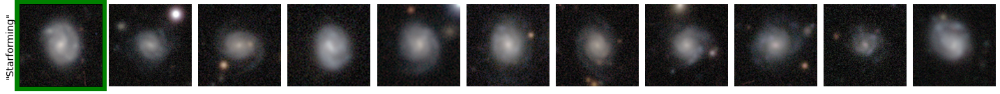

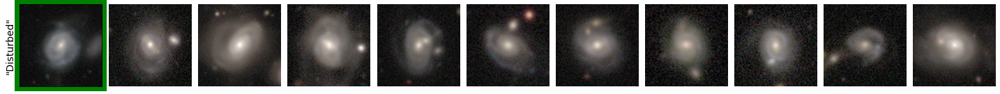

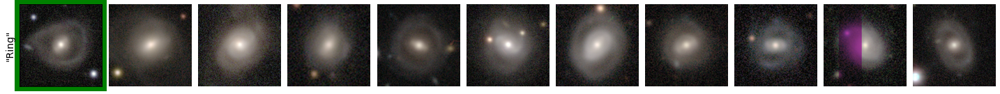

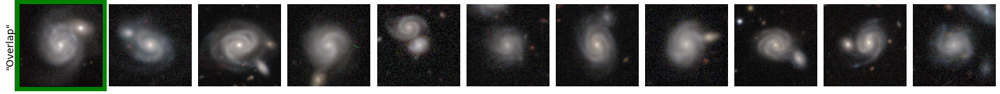

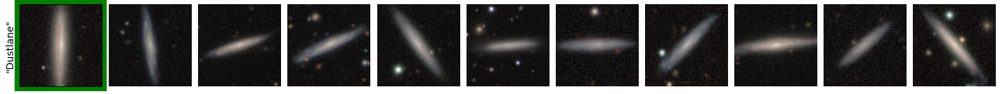

In [141]:

for tag_n, tag in enumerate(relevant_tags[:5]):
    # print(tag)
#     print(top_galaxy_by_tag[tag])
    galaxy_index = np.argmax(df_with_votes['iauname'] == top_iauname_with_votes[tag])
    # print(galaxy_index)
    most_similar_rep_galaxies = get_most_similar_galaxies(df_with_votes, embed_with_votes, galaxy_index)
    # most_similar_vote_galaxies = get_most_similar_galaxies(df_with_votes, vote_embed, galaxy_index)
    
    
    tag_label = f'"{tag.capitalize()}"'.replace('-', ' ').replace('_', ' ')
    fig = show_galaxies(most_similar_rep_galaxies, n_galaxies=n_galaxies, label=tag_label)  # first is itself
    
#     to save:
    # fig.savefig(f'/Users/walml/repos/morphology-tools/notebooks/similar/pca10/similar_{tag_n}_tag_{tag}_n{max_galaxies}_pca10_talk.png')
    plt.show()
    plt.close()

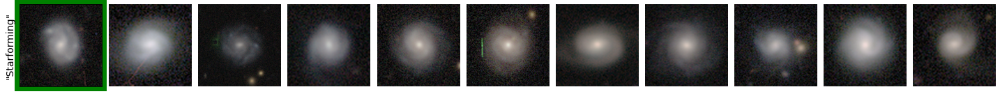

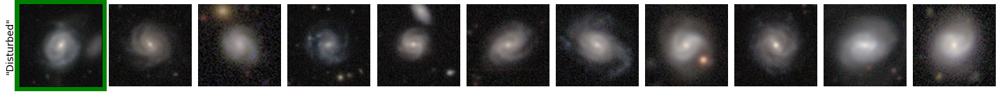

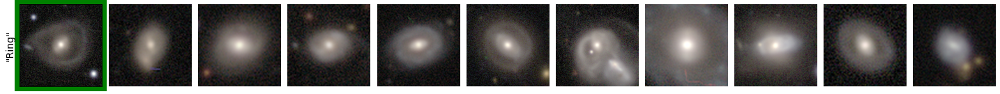

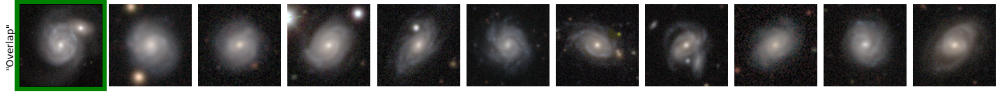

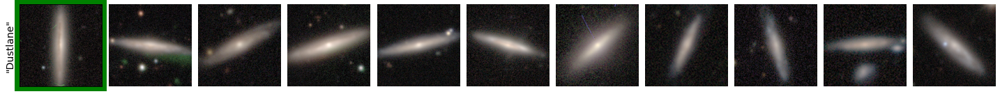

In [142]:

for tag_n, tag in enumerate(relevant_tags[:5]):
#     print(tag)
#     print(top_galaxy_by_tag[tag])
    galaxy_index = np.argmax(df_with_votes['iauname'] == top_iauname_with_votes[tag])
    
    # most_similar_rep_galaxies = get_most_similar_galaxies(df_with_votes, embed_with_votes, galaxy_index)
    most_similar_vote_galaxies = get_most_similar_galaxies(df_with_votes, vote_embed, galaxy_index)
    
    
    tag_label = f'"{tag.capitalize()}"'.replace('-', ' ').replace('_', ' ')
    fig = show_galaxies(most_similar_vote_galaxies, n_galaxies=n_galaxies, label=tag_label)  # first is itself
    
#     to save:
    # fig.savefig(f'/Users/walml/repos/morphology-tools/notebooks/similar/pca10/similar_{tag_n}_tag_{tag}_n{max_galaxies}_pca10_talk.png')
    plt.show()
    plt.close()

Are galaxies with different labels to their rep. neighbours more likely to be mislabelled?

- pick a galaxy, find rep. embed neighbours
- measure mean distance in vote embed to those neighbours
- repeat for all galaxy, rank by mean distance

In [181]:
galaxy_index = 0

def get_mean_label_distances_for_embed_neighbours(galaxy_index, vote_embed, embed_with_votes):
    query_in_vote_embed = vote_embed[galaxy_index].squeeze()
    most_similar_rep_indices = find_neighbours(embed_with_votes, galaxy_index, metric='euclidean').squeeze()[1:]  # first is itself
    those_galaxies_in_vote_embed = vote_embed[most_similar_rep_indices]
    euc_distances = np.sqrt(np.abs(query_in_vote_embed**2 - those_galaxies_in_vote_embed**2)).sum(axis=1)  # will broadcast
    mean_euc_distance = euc_distances.mean()
    return mean_euc_distance



In [182]:
# %timeit get_mean_label_distances_for_embed_neighbours(0, vote_embed, embed_with_votes)
# 20ms per, 30k * 20ms = 60s = 1 minute

19.5 ms ± 200 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [183]:
mean_euc_distances = np.array([get_mean_label_distances_for_embed_neighbours(index, vote_embed, embed_with_votes) for index in range(len(vote_embed))])

In [ ]:
indices = find_neighbours(embed, np.argmax(df['iauname'] == top_iauname['starforming']), metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=n_galaxies, label=f'"{tag.capitalize()}"')  # first is itself

In [ ]:
indices = find_neighbours(embed, np.argmax(df['iauname'] == top_iauname['agn']), metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=n_galaxies)  # first is itself

In [ ]:
indices = find_neighbours(embed, np.argmax(df['iauname'] == top_iauname['starburst']), metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=n_galaxies)  # first is itself

In [ ]:
indices = find_neighbours(embed, np.argmax(df['iauname'] == top_iauname['disturbed']), metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=n_galaxies)  # first is itself

In [ ]:
indices = find_neighbours(embed, np.argmax(df['iauname'] == top_iauname['ring']), metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=n_galaxies)  # first is itself

In [ ]:
indices = find_neighbours(embed, np.argmax(df['iauname'] == top_iauname['overlap']), metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=n_galaxies)  # first is itself

In [ ]:
indices = find_neighbours(embed, np.argmax(df['iauname'] == top_iauname['irregular']), metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=n_galaxies)  # first is itself

In [ ]:
indices = find_neighbours(embed, np.argmax(df['iauname'] == top_iauname['dustlane']), metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=n_galaxies)  # first is itself

In [ ]:
indices = find_neighbours(embed, np.argmax(df['iauname'] == top_iauname['asteroid']), metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=n_galaxies)  # first is itself

In [ ]:
psb_name = 'J124354.11+163250.5'  # in decals but not that 30k

In [ ]:
pca_10[interesting_index]

In [ ]:
X = pca_10

In [ ]:
indices = find_neighbours(X, interesting_index)
show_galaxies(df.iloc[np.squeeze(indices)])  # first is itself

In [ ]:
not_hoag = "J120143.46+001059.2"
not_hoag_index = np.argmax(df['iauname'] == not_hoag)

In [ ]:
indices = find_neighbours(X, not_hoag_index, metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)])  # first is itself

In [ ]:
overlap = "J114222.33+084611.5"
overlap_index = np.argmax(df['iauname'] == overlap)
indices = find_neighbours(X, overlap_index)
show_galaxies(df.iloc[np.squeeze(indices)])  # first is itself